In [11]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


from skimage import io, color, filters, exposure, morphology, segmentation, measure
from skimage.morphology import disk, dilation
from skimage.color import label2rgb
from skimage.feature import peak_local_max
from skimage.segmentation import watershed


from scipy import ndimage as ndi
from scipy.ndimage import binary_fill_holes, distance_transform_edt

In [12]:
def normalize01(x):
    rng = (x.max() - x.min())
    return (x - x.min()) / rng if rng != 0 else np.zeros_like(x)


data_dir = "C:/Users/User/Desktop/abs/projekat_abs/projekat/processed/Lung"
images_dir = os.path.join(data_dir, "images")
masks_dir = os.path.join(data_dir, "sem_masks")
masks_dir_inst = os.path.join(data_dir, "inst_masks")

image_files = sorted(os.listdir(images_dir))[:6]
mask_files = sorted(os.listdir(masks_dir))[:6]
mask_files_inst = sorted(os.listdir(masks_dir_inst))[:6]

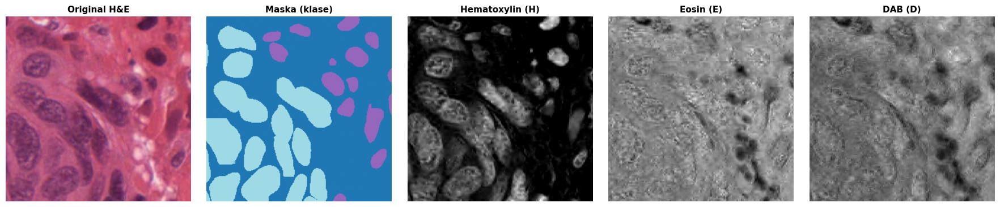

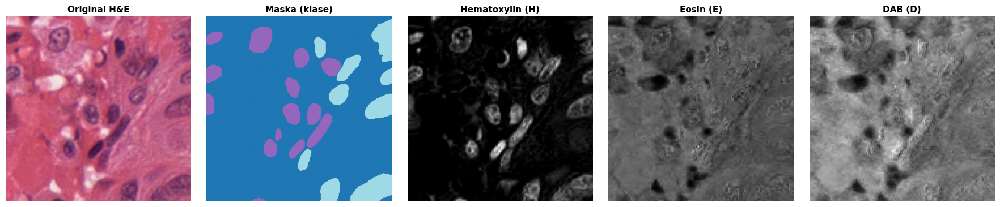

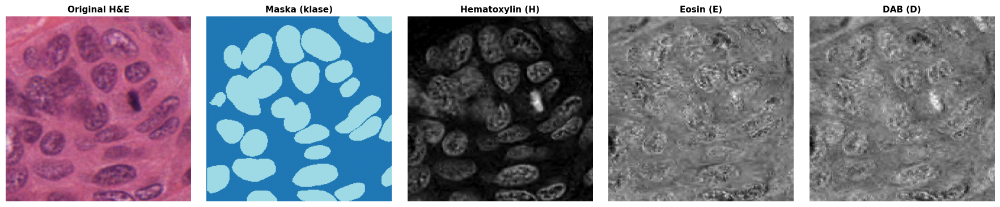

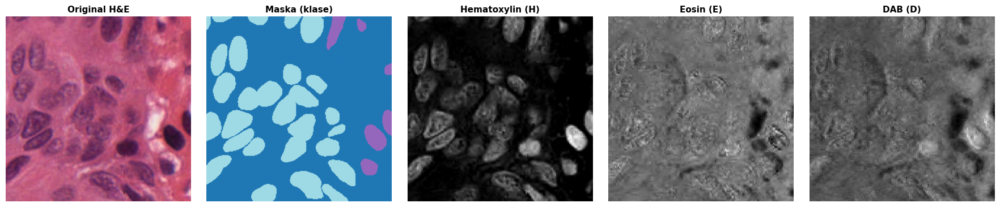

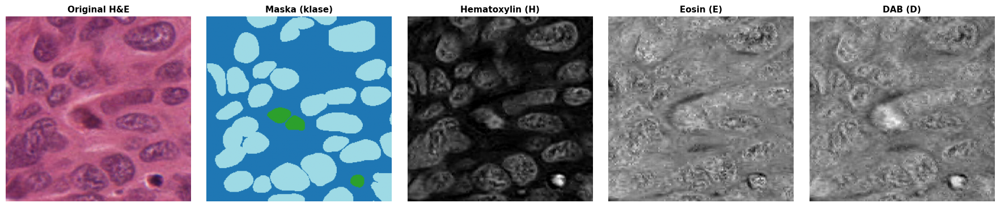

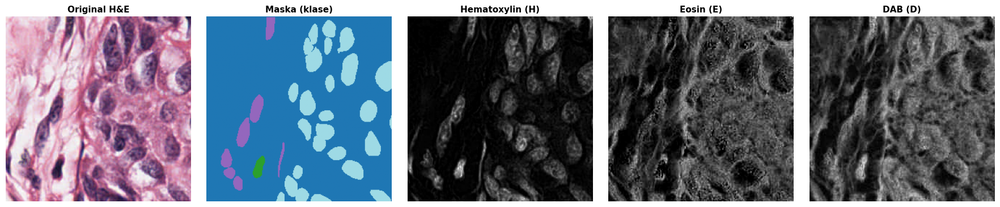

In [13]:
for img_file, mask_file in zip(image_files, mask_files):
   
    image = io.imread(os.path.join(images_dir, img_file))
    mask = np.array(Image.open(os.path.join(masks_dir, mask_file)))
    hed = color.rgb2hed(image)

    panels = [
        ("Original H&E", image, None),
        ("Maska (klase)", mask, "tab20"),
        ("Hematoxylin (H)", hed[:, :, 0], "gray"),
        ("Eosin (E)", normalize01(hed[:, :, 1]), "gray"),
        ("DAB (D)", normalize01(hed[:, :, 2]), "gray"),
    ]
  
    fig, axes = plt.subplots(1, len(panels), figsize=(18, 5))
    for ax, (title, img, cmap) in zip(axes, panels):
        ax.imshow(img, cmap=cmap)
        ax.set_title(title, fontsize=11, fontweight="bold")
        ax.axis("off")

    plt.tight_layout(pad=2)
    plt.show()


aj malo da se proba neki processing 

### 1 slika lung

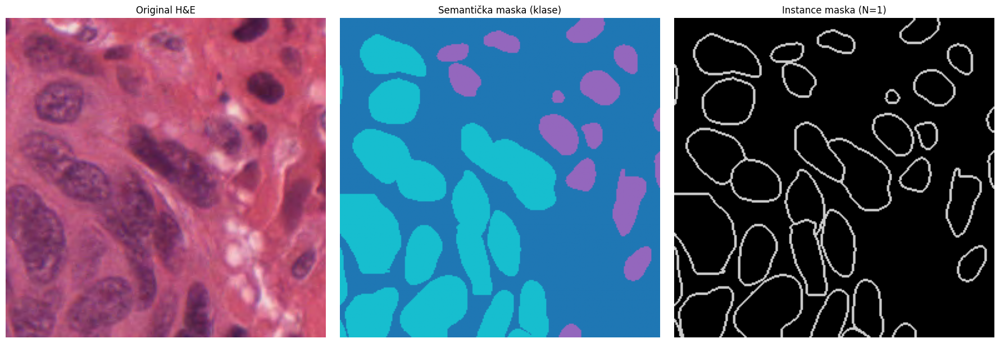

In [14]:
img_path  = os.path.join(images_dir, image_files[0])
mask_path = os.path.join(masks_dir,  mask_files[0])
mask_path_inst = os.path.join(masks_dir_inst,  mask_files_inst[0])       

image = io.imread(img_path)
mask  = np.array(Image.open(mask_path))
mask_inst  = np.array(Image.open(mask_path_inst))

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image)
axes[0].set_title("Original H&E")
axes[0].axis("off")

axes[1].imshow(mask, cmap="tab10")
axes[1].set_title("Semantička maska (klase)")
axes[1].axis("off")

axes[2].imshow(mask_inst, cmap="nipy_spectral")
axes[2].set_title(f"Instance maska (N={mask_inst.max()})")
axes[2].axis("off")

plt.tight_layout()
plt.show()


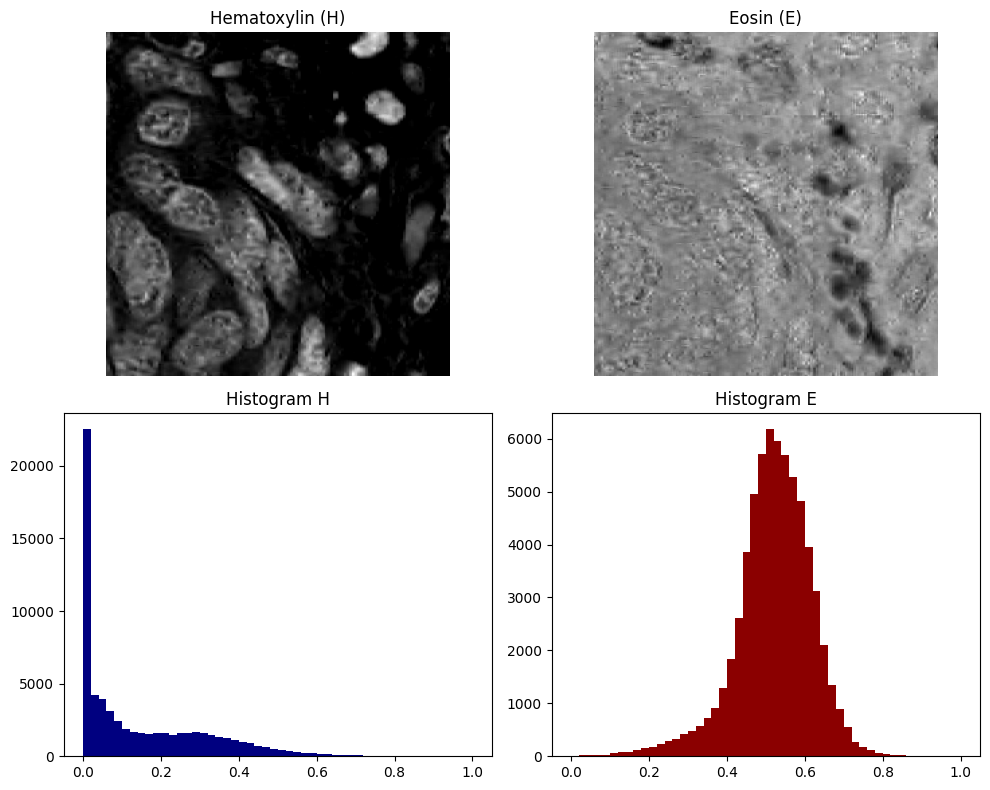

In [15]:
hed = color.rgb2hed(image)
H_norm01 = normalize01(hed[:, :, 0]) # hematoksilin komponenta
E_norm01 = normalize01(hed[:, :, 1]) # eozin komponenta

# prikaz H, E i histograma
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0,0].imshow(H_norm01, cmap="gray")
axes[0,0].set_title("Hematoxylin (H)")
axes[0,0].axis("off")

axes[0,1].imshow(E_norm01, cmap="gray")
axes[0,1].set_title("Eosin (E)")
axes[0,1].axis("off")

axes[1,0].hist(H_norm01.ravel(), bins=50, color="navy")
axes[1,0].set_title("Histogram H")

axes[1,1].hist(E_norm01.ravel(), bins=50, color="darkred")
axes[1,1].set_title("Histogram E")

plt.tight_layout()
plt.show()

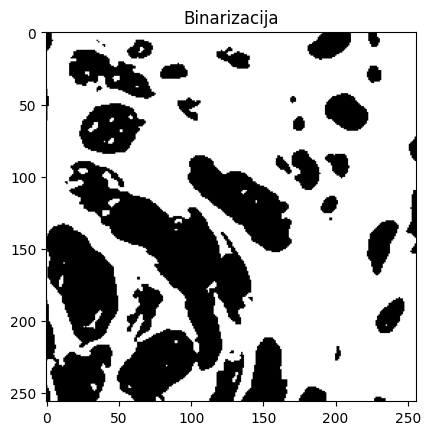

In [16]:

H_gauss = filters.gaussian(H_norm01, sigma=1)
H_contrast = exposure.adjust_sigmoid(H_gauss, gain=20, cutoff=0.2, inv=True)

plt.imshow(H_contrast, cmap="gray")
thr = filters.threshold_otsu(H_contrast)
binary = H_contrast > thr
plt.imshow(binary, cmap="gray")
plt.title("Binarizacija")
plt.show()

In [40]:
H_contrast[0,0]

np.float64(0.11348385286809459)

random proba koriscenja kmeans za segmentaciju 

In [28]:
import cv2

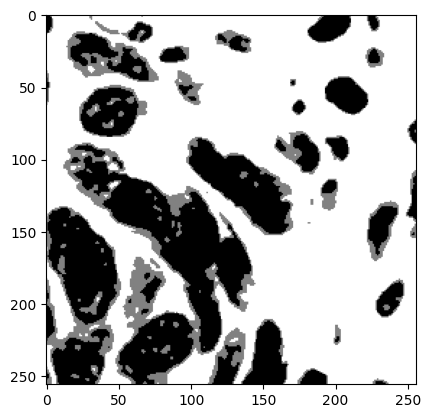

In [78]:
imgg = H_contrast.reshape((-1,1)).astype(np.float32) # radi samo s float32

# K-means parametri
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
k = 3
attempts = 10

# K-means
ret, label, center = cv2.kmeans(imgg, k, None, criteria, attempts, cv2.KMEANS_PP_CENTERS)

res = center[label.flatten()]
res2 = res.reshape(H_contrast.shape)

plt.imshow(res2, cmap='gray')
plt.show()

kraj random probe

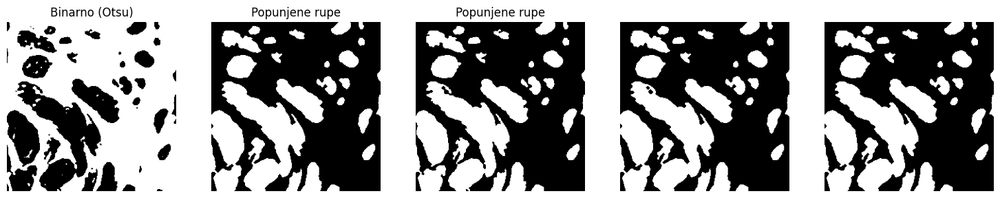

In [18]:
# Popuni rupe
filled = binary_fill_holes(1-binary)

# Malo ocisti
cleaned = morphology.remove_small_objects(filled, min_size=50)   #  bolje parametrizovati idk
closing = morphology.closing(cleaned, morphology.disk(2))
filled = binary_fill_holes(closing)
# Prikaz
fig, axes = plt.subplots(1, 5, figsize=(15, 5))
axes[0].imshow(binary, cmap="gray"); axes[0].set_title("Binarno (Otsu)")
axes[1].imshow(filled, cmap="gray"); axes[1].set_title("Popunjene rupe")
axes[2].imshow(cleaned, cmap="gray"); axes[2].set_title("Očišćeno")
axes[3].imshow(closing, cmap="gray"); axes[2].set_title("Dilatacija + erozija")
axes[4].imshow(filled, cmap="gray"); axes[2].set_title("Popunjene rupe")
plt.tight_layout()
for ax in axes: ax.axis("off")
plt.show()


In [19]:
def compute_markers_from_distance(distance, min_distance=8, threshold_rel=0.2,
                                  dilate_radius=2, min_markers=5):
    local_max_mask = peak_local_max(
        distance,
        min_distance=min_distance,
        threshold_abs=distance.max() * threshold_rel,
        exclude_border=False
    )

    if local_max_mask.dtype != bool:
        coords = local_max_mask
        local_max_mask = np.zeros_like(distance, dtype=bool)
        local_max_mask[tuple(coords.T)] = True

    markers_pixels = local_max_mask.astype(np.uint8)

    if markers_pixels.sum() < min_markers:
        morph_max = morphology.local_maxima(distance)
        markers_pixels = np.logical_or(markers_pixels, morph_max).astype(np.uint8)

    markers_dil = dilation(markers_pixels, disk(dilate_radius)) if dilate_radius > 0 else markers_pixels
    markers_labeled = ndi.label(markers_dil)[0]

    if markers_labeled.max() == 0:
        markers_labeled[distance == distance.max()] = 1

    return markers_pixels, markers_dil, markers_labeled


def watershed_seg(img, cleaned, watershed_min_distance=8,
                                marker_threshold_rel=0.2,
                                marker_dilate_radius=2,
                                verbose=True):
   

    # 4) Distance mapa + markeri
    dist = distance_transform_edt(cleaned)
    markers_pixels, markers_dil, markers_labeled = compute_markers_from_distance(
        dist,
        min_distance=watershed_min_distance,
        threshold_rel=marker_threshold_rel,
        dilate_radius=marker_dilate_radius,
        min_markers=5
    )

    # 5) Watershed
    labels = watershed(-dist, markers_labeled, mask=cleaned)
    w_lines = segmentation.find_boundaries(labels, mode='thick')
    labels[w_lines] = 0

    final_mask = measure.label(labels > 0)
    binary_final = final_mask > 0

    if verbose:
        fig, axes = plt.subplots(1, 5, figsize=(20, 10))
        axes = axes.ravel()

 
        axes[0].imshow(cleaned, cmap='gray'); axes[0].set_title("Binary cleaned"); axes[0].axis('off')

        axes[1].imshow(dist, cmap='magma'); axes[1].set_title("Distance transform"); axes[1].axis('off')
        axes[2].imshow(markers_labeled, cmap='nipy_spectral'); axes[2].set_title(f"Markers (N={markers_labeled.max()})"); axes[2].axis('off')
        axes[3].imshow(labels, cmap='nipy_spectral'); axes[3].set_title(f"Watershed (raw)"); axes[3].axis('off')
        overlay = label2rgb(final_mask, image=img, bg_label=0, alpha=0.35)

        axes[4].imshow(overlay); axes[4].set_title(f"Final mask (N={final_mask.max()})"); axes[4].axis('off')

        plt.tight_layout()
        plt.show()

        print("Markers (pixel count):", int(markers_pixels.sum()))
        print("Markers (labels):", int(markers_labeled.max()))
        print("Final detected instances:", int(final_mask.max()))

    return final_mask, binary_final


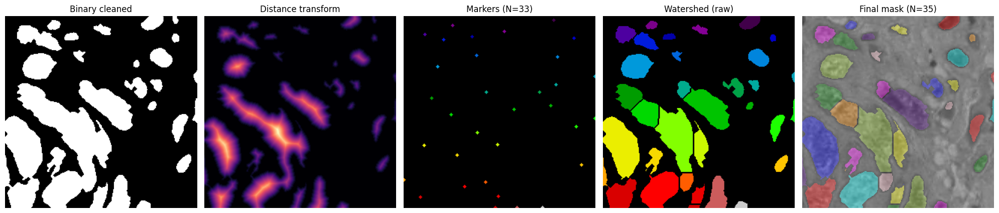

Markers (pixel count): 33
Markers (labels): 33
Final detected instances: 35


In [20]:
final_mask, binary_mask = watershed_seg(image, filled, verbose=True) 


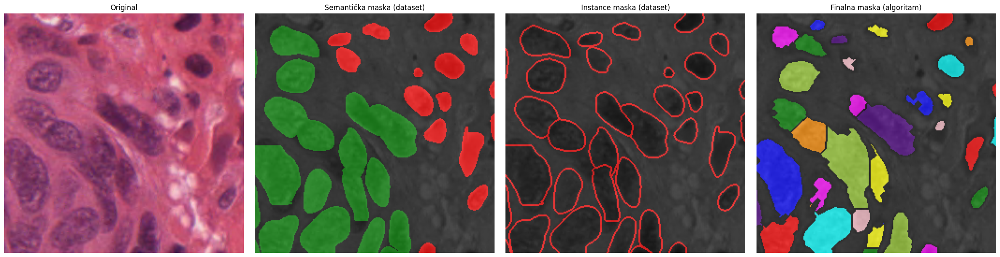

In [21]:
fig, axes = plt.subplots(1, 4, figsize=(24, 6))

axes[0].imshow(image)
axes[0].set_title("Original")
axes[0].axis("off")


overlay_sem = label2rgb(mask, image=image, bg_label=0, alpha=0.7, colors=['red','green','blue','yellow'])
axes[1].imshow(overlay_sem)
axes[1].set_title("Semantička maska (dataset)")
axes[1].axis("off")


overlay_inst = label2rgb(mask_inst, image=image, bg_label=0, alpha=0.7, kind='overlay')
axes[2].imshow(overlay_inst)
axes[2].set_title("Instance maska (dataset)")
axes[2].axis("off")

overlay_final = label2rgb(final_mask, image=image, bg_label=0, alpha=0.7, kind='overlay')
axes[3].imshow(overlay_final)
axes[3].set_title("Finalna maska (algoritam)")  
axes[3].axis("off")
plt.tight_layout()
plt.show()

In [22]:
def preprocess_he_image(image, 
                       gaussian_sigma=1.0,
                       contrast_gain=20,
                       contrast_cutoff=0.2,
                       contrast_inv=True,
                       min_size=50,
                       closing_radius=2,
                       verbose=True):
    """
    Preprocesiranje H&E slike za segmentaciju
    
    Parameters:
    - image: RGB H&E slika
    - gaussian_sigma: sigma za Gaussian blur
    - contrast_gain: gain za sigmoid contrast
    - contrast_cutoff: cutoff za sigmoid contrast
    - contrast_inv: da li invertovati sigmoid
    - min_size: minimalna veličina objekta
    - closing_radius: radius za closing operaciju
    - verbose: da li prikazati rezultate
    
    Returns:
    - cleaned_binary: očišćena binarna maska
    - H_contrast: poboljšani Hematoxylin kanal
    - binary: osnovna binarna maska
    """
    
    # 1. HED dekonvolucija
    hed = color.rgb2hed(image)
    H_norm01 = normalize01(hed[:, :, 0])  # Hematoxylin kanal
    
    # 2. Gaussian blur
    H_gauss = filters.gaussian(H_norm01, sigma=gaussian_sigma)
    
    # 3. Kontrast enhancement
    H_contrast = exposure.adjust_sigmoid(H_gauss, 
                                       gain=contrast_gain, 
                                       cutoff=contrast_cutoff, 
                                       inv=contrast_inv)
    
    # 4. Otsu thresholding
    thr = filters.threshold_otsu(H_contrast)
    binary = H_contrast > thr
    
    # 5. Morfološko čišćenje
    # Popuni rupe
    filled = binary_fill_holes(1 - binary)  # invertuj ako treba
    
    # Ukloni male objekte
    cleaned = morphology.remove_small_objects(filled, min_size=min_size)
    
    # Closing operacija
    closed = morphology.closing(cleaned, morphology.disk(closing_radius))
    
    # Finalno popunjavanje rupa
    cleaned_binary = binary_fill_holes(closed)
    
    if verbose:
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
        
        # Red 1: Osnovni koraci
        axes[0,0].imshow(image)
        axes[0,0].set_title("Original H&E")
        axes[0,0].axis("off")
        
        axes[0,1].imshow(H_norm01, cmap="gray")
        axes[0,1].set_title("Hematoxylin (normalizovano)")
        axes[0,1].axis("off")
        
        axes[0,2].imshow(H_contrast, cmap="gray")
        axes[0,2].set_title(f"Kontrast (gain={contrast_gain})")
        axes[0,2].axis("off")
        
        axes[0,3].imshow(binary, cmap="gray")
        axes[0,3].set_title(f"Binarizacija (t={thr:.3f})")
        axes[0,3].axis("off")
        
        # Red 2: Morfološke operacije
        axes[1,0].imshow(filled, cmap="gray")
        axes[1,0].set_title("Popunjene rupe")
        axes[1,0].axis("off")
        
        axes[1,1].imshow(cleaned, cmap="gray")
        axes[1,1].set_title(f"Uklonjeni mali objekti (min_size={min_size})")
        axes[1,1].axis("off")
        
        axes[1,2].imshow(closed, cmap="gray")
        axes[1,2].set_title(f"Closing (radius={closing_radius})")
        axes[1,2].axis("off")
        
        axes[1,3].imshow(cleaned_binary, cmap="gray")
        axes[1,3].set_title("Finalna očišćena maska")
        axes[1,3].axis("off")
        
        plt.tight_layout()
        plt.show()

    
    return cleaned_binary


## Probica

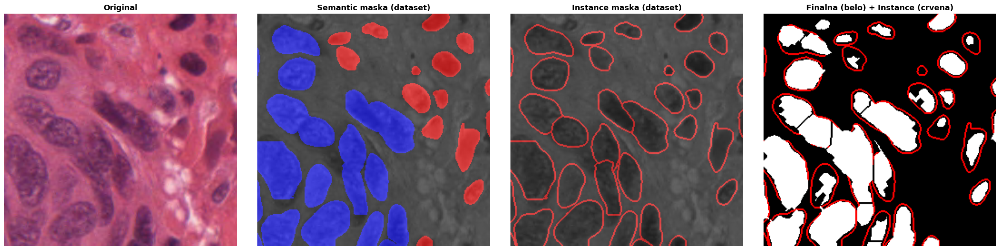

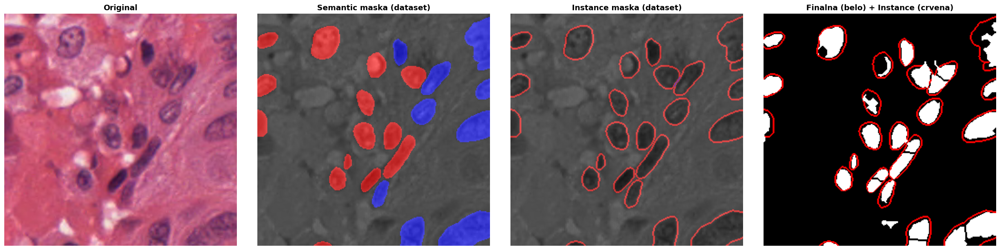

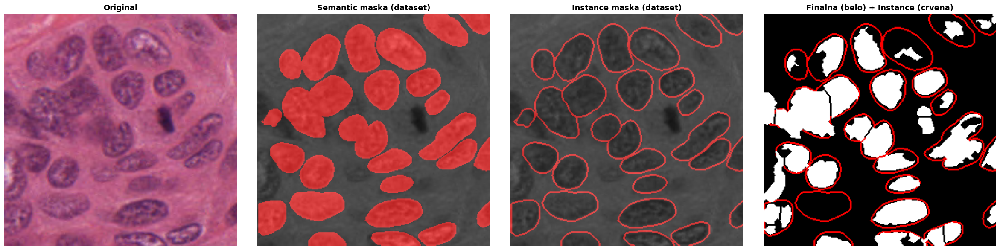

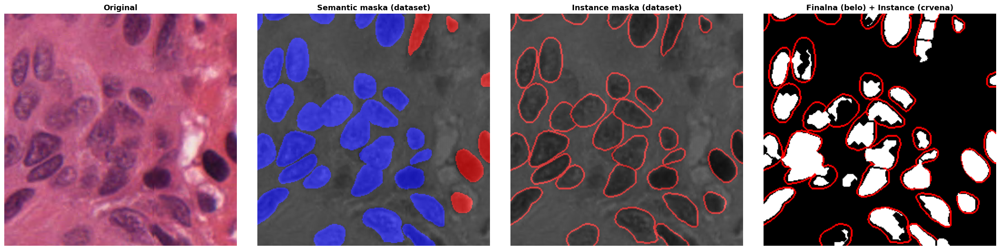

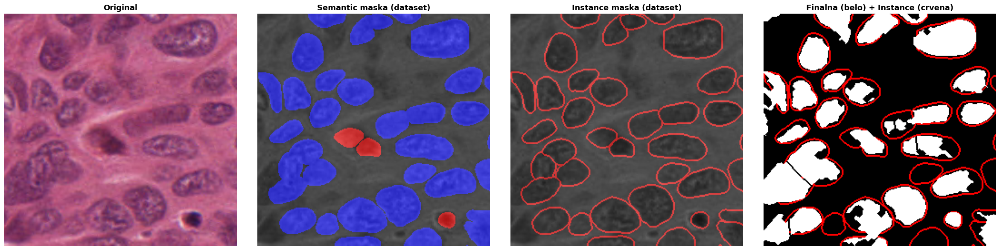

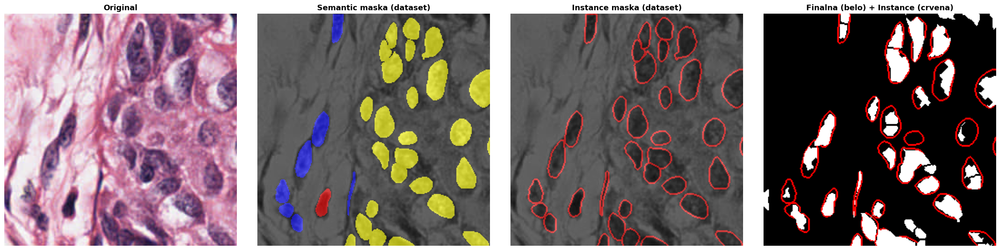

In [23]:
for img_file, mask_file, mask_file_inst in zip(image_files, mask_files, mask_files_inst):
   
    image     = io.imread(os.path.join(images_dir, img_file))
    mask_sem  = np.array(Image.open(os.path.join(masks_dir, mask_file)))
    mask_inst = np.array(Image.open(os.path.join(masks_dir_inst, mask_file_inst)))


    cleaned_mask = preprocess_he_image(
        image, gaussian_sigma=1.0, contrast_gain=20,
        contrast_cutoff=0.2, contrast_inv=True,
        min_size=50, closing_radius=2, verbose=False
    )
    final_mask, _ = watershed_seg(image, cleaned_mask, verbose=False) 


    overlay_sem  = label2rgb(mask_sem,  image=image, bg_label=0, alpha=0.6, kind="overlay")
    overlay_inst = label2rgb(mask_inst, image=image, bg_label=0, alpha=0.6, kind="overlay")

 
    final_rgb = np.zeros((*final_mask.shape, 3), dtype=float)
    final_rgb[final_mask > 0] = [1, 1, 1]     
    inst_rgb = np.zeros_like(final_rgb)
    inst_rgb[mask_inst > 0] = [1, 0, 0]       
    overlay_both = np.clip(final_rgb + inst_rgb, 0, 1)

  
    fig, axes = plt.subplots(1, 4, figsize=(24, 6))
    plots = [
        (image,        "Original"),
        (overlay_sem,  "Semantic maska (dataset)"),
        (overlay_inst, "Instance maska (dataset)"),
        (overlay_both, "Finalna (belo) + Instance (crvena)"),
    ]

    for ax, (img, title) in zip(axes, plots):
        ax.imshow(img)
        ax.set_title(title, fontsize=13, fontweight="bold")
        ax.axis("off")

    plt.tight_layout(pad=2)
    plt.show()
